# PART I

## Figure 1 Map

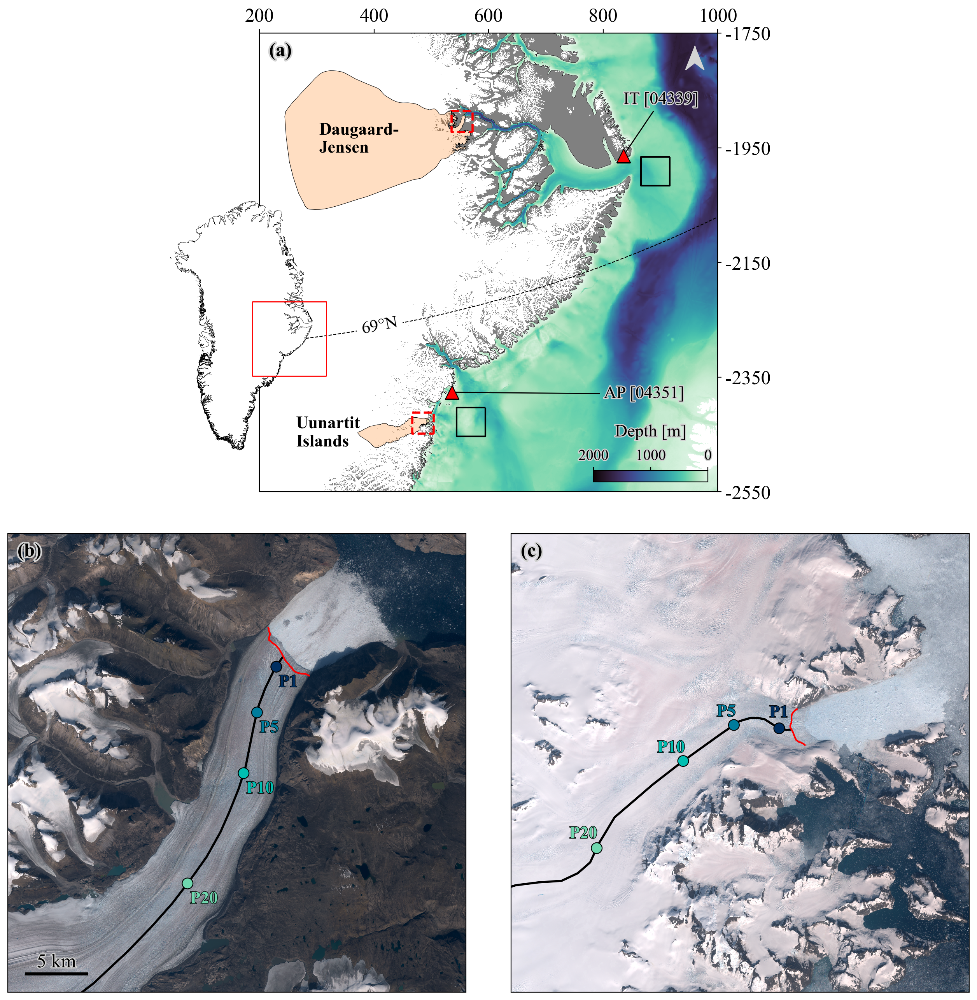

In [10]:
import cartopy.crs as ccrs
import geopandas as gpd
import matplotlib.colors as mcolors
import matplotlib.patches as patches
import matplotlib.patheffects as patheffects
import matplotlib.pyplot as plt
import rioxarray as rxr
import shapely.geometry
import shapely.ops
import seaborn
from matplotlib.font_manager import FontProperties
from matplotlib.gridspec import GridSpec
from matplotlib.offsetbox import AnchoredText
from matplotlib.ticker import FuncFormatter
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# Plot paramaters
AXS_EXTENTS = {
    0: [200_000, -2_550_000, 1_000_000, -1_750_000],
    1: (535481.764, -1922392.335, 572336.604, -1885537.495),
    2: (467075.608, -2448422.750, 503930.448, -2411567.910),
    3: (-683319.877, -3352550.000, 1012836.774, -665405.245),
}
ANNOTATION_AIR_STATIONS = {
    "Aputiteeq": {
        "label": "AP [04351]",
        "d_xy": (265_000, -10_000),
    },
    "Ittoqqortoormiit": {
        "label": "IT [04339]",
        "d_xy": (0, 90_000),
    },
}
ANNOTATION_POINTS = {
    "DAUGAARD-JENSEN": {
        1_000: (200, -1_600),
        5_000: (200, -1_600),
        10_000: (200, -1_600),
        20_000: (200, -1_600),
    },
    "UNNAMED_UUNARTIT_ISLANDS": {
        1_000: (-800, 900),
        5_000: (-1_400, 700),
        10_000: (-2_100, 700),
        20_000: (-2_200, 800),
    },
}

# Global plot settings
plt.rcParams["figure.dpi"] = 200
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 18
plt.rcParams["axes.labelsize"] = 18
plt.rcParams["xtick.labelsize"] = 18
plt.rcParams["ytick.labelsize"] = 18

# Create EPSG:3413 projection [see https://nsidc.org/data/user-resources/help-center/guide-nsidcs-polar-stereographic-projection]
proj_3413 = ccrs.Stereographic(central_latitude=90, central_longitude=-45, true_scale_latitude=70)

# Create gridspec and 'floating' inset
fig = plt.figure(figsize=(16, 16))
gs = GridSpec(nrows=4, ncols=4)
ax0 = fig.add_subplot(gs[0:2, 1:3], projection=proj_3413)
ax1 = fig.add_subplot(gs[2:4, 0:2], projection=proj_3413)
ax2 = fig.add_subplot(gs[2:4, 2:4], projection=proj_3413)
ax3 = fig.add_subplot([0.22, 0.545, 0.20, 0.20], projection=proj_3413, zorder=10)
axs = [ax0, ax1, ax2, ax3]

# Fix axes extents and remove background and border for inset
ax0.set_extent([AXS_EXTENTS[0][0], AXS_EXTENTS[0][2], AXS_EXTENTS[0][1], AXS_EXTENTS[0][3]], crs=ccrs.epsg(3413))
ax1.set_extent([AXS_EXTENTS[1][0], AXS_EXTENTS[1][2], AXS_EXTENTS[1][1], AXS_EXTENTS[1][3]], crs=ccrs.epsg(3413))
ax2.set_extent([AXS_EXTENTS[2][0], AXS_EXTENTS[2][2], AXS_EXTENTS[2][1], AXS_EXTENTS[2][3]], crs=ccrs.epsg(3413))
ax3.set_extent([AXS_EXTENTS[3][0], AXS_EXTENTS[3][2], AXS_EXTENTS[3][1], AXS_EXTENTS[3][3]], crs=ccrs.epsg(3413))
ax3.spines.geo.set_visible(False)
ax3.patch.set_alpha(0)

# Read Greenland outline and plot on inset and ax0 [see https://data.bas.ac.uk/full-record.php?id=GB/NERC/BAS/PDC/01439]
greenland = gpd.read_file("../data/misc/coastline/coastline.geojson")
greenland.plot(ax=ax0, facecolor="none", edgecolor="black", linewidth=0.25, zorder=5)
greenland.plot(ax=ax3, facecolor="white", edgecolor="black", linewidth=0.25)

# Draw overview of ax0 on inset
overview = gpd.GeoDataFrame(geometry=[shapely.geometry.box(*AXS_EXTENTS[0])])
overview.plot(ax=ax3, facecolor="none", edgecolor="red", linewidth=1)

# Read, clip, and plot BedMachine-v5 bedrock mask
bedmachine = rxr.open_rasterio("../data/misc/bedmachine/BedMachineGreenland-v5.nc")
bedmachine_mask = bedmachine.mask.rio.clip_box(*AXS_EXTENTS[0]).squeeze()
cmap = mcolors.ListedColormap(["none", "#808080", "white"])
norm = mcolors.BoundaryNorm([0, 1, 2, 3], cmap.N)
bedmachine_mask.plot(ax=ax0, cmap=cmap, norm=norm, add_colorbar=False, zorder=0, transform=proj_3413)

# Read, reproject, clip International Bathymetric Chart of the Arctic Ocean
ibcao = rxr.open_rasterio("../data/misc/bathymetry/ibcao_bathymetry_v4-2.nc").rio.write_crs(3996)
ibcao = ibcao.rio.reproject(3413)
ibcao = ibcao.rio.clip_box(*AXS_EXTENTS[0]).squeeze()
ibcao = ibcao.rio.clip(greenland.geometry, invert=True)
ibcao = ibcao.where(ibcao <= 0, drop=True)

# Create cbar axis, plot IBCAO, and format cbar
ibcao_cbar = inset_axes(ax0, width="25%", height="2.5%", loc="lower right")
ibcao.plot(
    ax=ax0,
    cmap="mako",
    vmin=-2_000,
    vmax=0,
    add_colorbar=True,
    zorder=0,
    transform=proj_3413,
    cbar_kwargs=dict(
        cax=ibcao_cbar,
        orientation="horizontal",
        ticks=[-2_000, -1_000, 0],
        label="",
        pad=0.25,
    ),
)
ibcao_cbar.xaxis.set_ticks_position("top")
ibcao_cbar.tick_params(labelsize=14)
ibcao_cbar.set_xticks(
    ibcao_cbar.get_xticks(),
    labels=ibcao_cbar.get_xticklabels(),
    path_effects=[patheffects.withStroke(linewidth=2, foreground="lightgrey")],
)
ibcao_cbar.xaxis.set_major_formatter(FuncFormatter(lambda x, _: str(x).replace("-", "")))
ibcao_cbar.set_title(
    "Depth [m]", fontsize=16, pad=12, path_effects=[patheffects.withStroke(linewidth=2, foreground="lightgrey")]
)

# Read and plot air station locations
air_stations = gpd.read_file("../data/air/air_stations.geojson")
air_stations.plot(ax=ax0, marker="^", markersize=160, facecolor="red", edgecolor="black", linewidth=0.8, zorder=10)

# Construct and plot ocean temperature sampling zones
ocean_points = gpd.read_file("../data/ocean/ocean_sample_points.geojson")
ocean_boxes = ocean_points.buffer(25_000, cap_style="square")
ocean_boxes.plot(ax=ax0, facecolor="none", edgecolor="black", linewidth=1.5)

# Read and plot glacier basins [see https://doi.org/10.7280/D1WT11]
basins = gpd.read_file("../data/misc/basins/basins.geojson")
basins.plot(ax=ax0, facecolor=(1.0, 0.498, 0.055, 0.25), edgecolor="black", linewidth=0.4)

# Read and plot line at 69degN
line_69N = gpd.read_file("../data/misc/69n.geojson")
line_69N.plot(ax=ax0, color="black", linestyle="--", linewidth=0.8)

# Construct and plot overviews of ax1 and ax2 on ax0
overviews = gpd.GeoDataFrame(geometry=[shapely.geometry.box(*AXS_EXTENTS[1]), shapely.geometry.box(*AXS_EXTENTS[2])])
overviews.plot(ax=ax0, facecolor="none", edgecolor="red", linestyle="--", linewidth=2, zorder=10)

# Draw ticks and format labels
ax0_top = ax0.secondary_xaxis("top")
ax0_top.set_xticks([200_000, 400_000, 600_000, 800_000, 1_000_000])
ax0_top.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x / 1_000:.0f}"))
ax0_right = ax0.secondary_yaxis("right")
ax0_right.set_yticks([-2_550_000, -2_350_000, -2_150_000, -1_950_000, -1_750_000])
ax0_right.yaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x / 1_000:.0f}"))

# Draw north arrow
ax0.add_patch(
    patches.FancyArrow(
        0.95,
        0.97,
        0,
        0.0001,
        color="lightgrey",
        head_width=0.04,
        head_length=0.05,
        length_includes_head=True,
        overhang=0.3,
        transform=ax0.transAxes,
    )
)

# Plot basemap on ax1 and ax2
basemap = rxr.open_rasterio(
    "/vsicurl/http://its-live-data.jpl.nasa.gov.s3.amazonaws.com/rgb_mosaics/GRE2/Greenlandmedian_Aug_2019.vrt"
)
for i in [1, 2]:
    map = basemap.rio.clip_box(*AXS_EXTENTS[i]).squeeze()
    map.plot.imshow(ax=axs[i])

# Read, subset, and plot centreline points
points = gpd.read_file("../data/misc/centreline_points.geojson")
points = points.loc[points.cd.isin([1_000, 5_000, 10_000, 20_000, 40_000])]
cmap = mcolors.ListedColormap(["#002f61", "#007c9c", "#00bfb2", "#6fd8af"])
norm = mcolors.BoundaryNorm([0, 1, 2, 3, 4], cmap.N)
for i, (glacier, gdf) in enumerate(points.groupby("glacier")):
    gdf.plot(ax=axs[i + 1], markersize=100, cmap=cmap, norm=norm, edgecolor="black", linewidth=0.8, zorder=10)

# Read, select, and plot minimum observed terminus position trace
traces = gpd.read_file("../data/terminus/terminus_traces_2000_2023.geojson")
traces = traces.loc[traces.date.isin(["2019-12-06", "2019-12-08"])]
for i, (glacier, gdf) in enumerate(traces.groupby("glacier")):
    gdf.plot(ax=axs[i + 1], color="red", zorder=10)

# Read centrelines, split at minimum terminus position, and plot
centrelines = gpd.read_file("../data/misc/centreline_lines.geojson")
for i, (glacier, gdf) in enumerate(centrelines.groupby("glacier")):
    split = shapely.ops.split(gdf.geometry.item(), traces.loc[traces.glacier == glacier].geometry.item())
    split = gpd.GeoDataFrame(geometry=[split.geoms[1]])
    split.plot(ax=axs[i + 1], color="black", linewidth=2)

# Draw axes labels
for i, ax in enumerate(axs[0:3]):
    label = AnchoredText(
        f"({chr(97 + i)})", loc="upper left", borderpad=0.1, prop=dict(weight="semibold"), frameon=False
    )
    label.txt._text.set_path_effects([patheffects.withStroke(linewidth=3, foreground="lightgrey")])
    ax.add_artist(label)

# Draw scale bar on ax1
scale_bar = AnchoredSizeBar(
    ax1.transData,
    5_000,
    "5 km",
    "lower left",
    pad=0.8,
    sep=1.1,
    label_top=True,
    color="black",
    frameon=False,
    size_vertical=150,
    fontproperties=FontProperties(size=18, math_fontfamily="stix"),
    fill_bar=True,
)
scale_bar.txt_label._text.set_path_effects([patheffects.withStroke(linewidth=2, foreground="lightgrey")])
ax1.add_artist(scale_bar)

# Annotate glaciers and 69degN line
ax0.text(0.13, 0.74, "Daugaard-\nJensen", fontsize=16, weight="semibold", transform=ax0.transAxes)
ax0.text(0.08, 0.10, "Uunartit\nIslands", fontsize=16, weight="semibold", transform=ax0.transAxes)
ax0.text(0.22, 0.345, "69\N{DEGREE SIGN}N", fontsize=16, backgroundcolor="white", rotation=11, transform=ax0.transAxes)

# Annotate air station points with callout label
for station_name, gdf in air_stations.groupby("station_name"):
    xy = (gdf.geometry.item().x, gdf.geometry.item().y)
    label = ANNOTATION_AIR_STATIONS[station_name]["label"]
    d_xy = ANNOTATION_AIR_STATIONS[station_name]["d_xy"]
    xy_text = (xy[0] + d_xy[0], xy[1] + d_xy[1])
    ax0.annotate(
        label,
        xy=xy,
        xycoords="data",
        xytext=xy_text,
        color="black",
        path_effects=[patheffects.withStroke(linewidth=2, foreground="lightgrey")],
        fontsize=16,
        arrowprops=dict(facecolor="black", arrowstyle="-"),
    )

# Annotate centreline points
for i, (glacier, gdf) in enumerate(points.groupby("glacier")):
    gdf = gdf.loc[gdf.cd != 40_000]
    for j, point in gdf.reset_index().iterrows():
        xy = (point.geometry.x, point.geometry.y)
        d_xy = ANNOTATION_POINTS[glacier][point.cd]
        xy_text = (xy[0] + d_xy[0], xy[1] + d_xy[1])
        axs[i + 1].annotate(
            f"P{point.cd / 1_000:.0f}",
            xy=xy,
            xytext=xy_text,
            xycoords="data",
            fontsize=16,
            fontweight="semibold",
            horizontalalignment="left",
            color=cmap.colors[j],
            path_effects=[patheffects.withStroke(linewidth=1, foreground="black")],
        )


ax0.set_title("")
ax1.set_title("")
ax2.set_title("")
plt.savefig("../img/lowres/figure_1_map.png", dpi=fig.dpi, bbox_inches="tight")
plt.show()

## Figure 2 Terminus

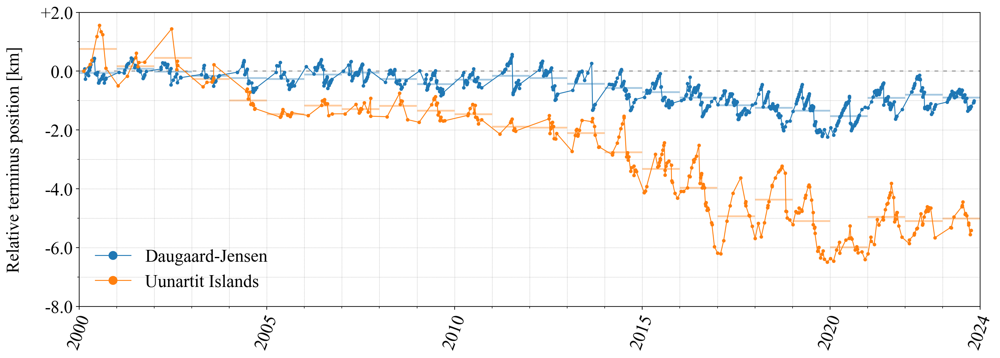

In [12]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr
from matplotlib.dates import DateFormatter, YearLocator, date2num
from matplotlib.gridspec import GridSpec
from matplotlib.ticker import FuncFormatter, MultipleLocator

# Global plot settings
plt.rcParams["figure.dpi"] = 200
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["mathtext.fontset"] = "stix"
plt.rcParams["font.size"] = 20
plt.rcParams["axes.labelsize"] = 20
plt.rcParams["xtick.labelsize"] = 20
plt.rcParams["ytick.labelsize"] = 20

# Colours and label for each series
PLOT_SETTINGS = {
    "DAUGAARD-JENSEN": {
        "colour": [(0.122, 0.467, 0.706, 1.0), (0.122, 0.467, 0.706, 0.25)],
        "label": "Daugaard-Jensen",
    },
    "UNNAMED_UUNARTIT_ISLANDS": {
        "colour": [(1.0, 0.498, 0.055, 1.0), (1.0, 0.498, 0.055, 0.25)],
        "label": "Uunartit Islands",
    },
}

# Set up axis
fig = plt.figure(figsize=(16, 6))
gs = GridSpec(nrows=1, ncols=1)
ax = fig.add_subplot(gs[0, 0])

# Load terminus change data
terminus_ds = xr.open_dataset("../data/terminus/terminus_2000_2023.nc")

# Group terminus data by glacier
for glacier, ds in terminus_ds.groupby("glacier", squeeze=False):
    # Convert terminus change data to km
    terminus_change = ds.area_width_averaged_change.squeeze().dropna("time") / 1_000
    ax.plot(
        terminus_change.time,
        terminus_change,
        label=PLOT_SETTINGS[glacier]["label"],
        marker="o",
        linewidth=1,
        markersize=3,
        markeredgecolor=PLOT_SETTINGS[glacier]["colour"][0],
        markerfacecolor=PLOT_SETTINGS[glacier]["colour"][0],
        color=PLOT_SETTINGS[glacier]["colour"][0],
    )

    annual_averages = ds.area_width_averaged_change.squeeze().resample(time="1YS").mean("time").squeeze() / 1_000
    for da in annual_averages:
        ax.hlines(
            y=da.values,
            xmin=da.time.values,
            xmax=da.time.values + np.timedelta64(365, "D"),
            colors=PLOT_SETTINGS[glacier]["colour"][0],
            linestyles="-",
            linewidth=2,
            alpha=0.4,
            zorder=1,
        )

# Set y-axis range and add label
ax.set_ylim(bottom=-8, top=2)
ax.set_ylabel("Relative terminus position [km]", labelpad=20)
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: f"+{x}" if x > 0 else str(x)))
ax.yaxis.set_minor_locator(MultipleLocator(1))

# Set x-axis range
ax.set_xlim(pd.to_datetime("2000-01-01"), pd.to_datetime("2024-01-01"))

# Format x-axis ticks: text format, frequency, rotation
ax.xaxis.set_major_formatter(DateFormatter("%Y"))
ax.xaxis.set_major_locator(YearLocator(5))
ax.xaxis.set_minor_locator(YearLocator(1))
ax.tick_params(axis="x", rotation=70)
xticks = [date2num(pd.to_datetime(i, format="%Y")) for i in [2000, 2005, 2010, 2015, 2020, 2024]]
ax.set_xticks(xticks)

ax.margins(x=0)
ax.axhline(y=0, c="black", alpha=0.7, linewidth=0.7, zorder=1, linestyle=(0, (6, 8)))
ax.grid(True, which="both", axis="both", c="gray", linestyle=":", linewidth=0.5, alpha=0.8, zorder=0)
ax.legend(frameon=False, loc="lower left", fontsize=20, markerscale=3, scatterpoints=1)

plt.tight_layout()
plt.savefig("../img/lowres/figure_2_terminus.png", dpi=fig.dpi, bbox_inches="tight")
plt.show()

## Figure 3 Velocity + Discharge

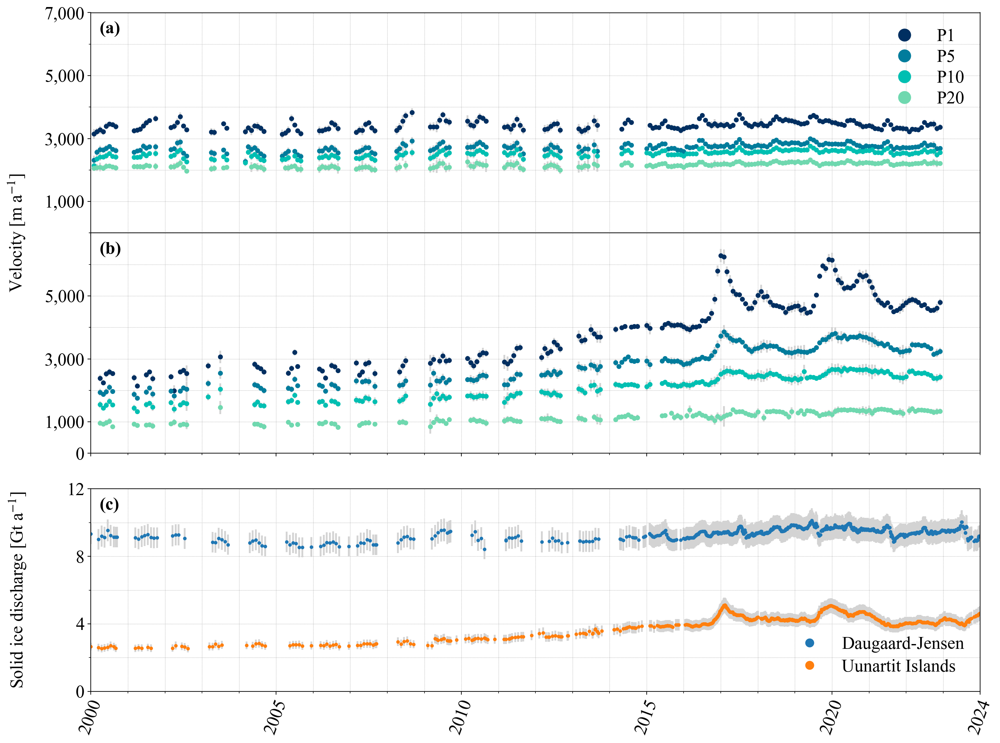

In [14]:
import matplotlib.pyplot as plt
import pandas as pd
import xarray as xr
from matplotlib.container import ErrorbarContainer
from matplotlib.dates import DateFormatter, YearLocator, date2num
from matplotlib.gridspec import GridSpec
from matplotlib.offsetbox import AnchoredText
from matplotlib.ticker import MultipleLocator, FuncFormatter

PLOT_SETTINGS = {
    "DAUGAARD-JENSEN": {
        "colour": [(0.122, 0.467, 0.706, 1.0), (0.122, 0.467, 0.706, 0.25)],
        "label": "Daugaard-Jensen",
    },
    "UNNAMED_UUNARTIT_ISLANDS": {
        "colour": [(1.0, 0.498, 0.055, 1.0), (1.0, 0.498, 0.055, 0.25)],
        "label": "Uunartit Islands",
    },
}

COLOURS = {
    1_000: "#002f61",
    5_000: "#007c9c",
    10_000: "#00bfb2",
    20_000: "#6fd8af",
}

# Global plot settings
plt.rcParams["figure.dpi"] = 200
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["mathtext.fontset"] = "stix"
plt.rcParams["font.size"] = 20
plt.rcParams["axes.labelsize"] = 20
plt.rcParams["xtick.labelsize"] = 20
plt.rcParams["ytick.labelsize"] = 20

# Set up axes
fig = plt.figure(figsize=(16, 12))
gs0 = GridSpec(nrows=3, ncols=1, figure=fig)
gs1 = gs0[0:2].subgridspec(nrows=2, ncols=1, hspace=0)
ax0 = fig.add_subplot(gs1[0, 0])
ax1 = fig.add_subplot(gs1[1, 0], sharex=ax0)
gs2 = gs0[2].subgridspec(nrows=1, ncols=1)
ax2 = fig.add_subplot(gs2[0, 0])
axs = [ax0, ax1, ax2]

velocity_ds = xr.open_dataset("../data/velocity/velocity_subannual_2000_2022.nc")
velocity_ds = velocity_ds.where(velocity_ds.date_dt.dt.days <= 30, drop=True)
velocity_ds = velocity_ds.where(velocity_ds.v_error < 500, drop=True)
velocity_ds = velocity_ds.sortby("mid_date").resample(mid_date="1MS").mean()
for i, (glacier, ds) in enumerate(velocity_ds.groupby("glacier", squeeze=False)):
    for cd, cd_ds in ds.groupby("cd", squeeze=False):
        v = cd_ds.v.squeeze().dropna("mid_date")
        v_error = cd_ds.v_error.squeeze().dropna("mid_date")
        axs[i].errorbar(
            v.mid_date.values,
            v.values,
            v_error.values,
            label=f"P{str(cd)[:-3]}",
            marker="o",
            markersize=4.5,
            linestyle="",
            elinewidth=2,
            markeredgecolor=COLOURS[cd],
            markerfacecolor=COLOURS[cd],
            ecolor="lightgrey",
        )

    axs[i].set_xlim(pd.to_datetime("2000-01-01"), pd.to_datetime("2024-01-01"))

    axs[i].xaxis.set_major_formatter(DateFormatter("%Y"))
    axs[i].xaxis.set_major_locator(YearLocator(5))
    axs[i].xaxis.set_minor_locator(YearLocator(1))
    axs[i].tick_params(axis="x", rotation=70)

    axs[i].margins(x=0)
    axs[i].grid(True, which="both", axis="both", c="gray", linestyle=":", linewidth=0.5, alpha=0.8, zorder=0)
    axs[i].add_artist(
        AnchoredText(f"({chr(97 + i)})", loc="upper left", borderpad=0.1, prop=dict(weight="semibold"), frameon=False)
    )


discharge_ds = xr.open_dataset("../data/discharge/discharge_monthly_2000_2024.nc")
discharge_ds = discharge_ds.where(discharge_ds.coverage >= 0.50)
for glacier, ds in discharge_ds.groupby("glacier", squeeze=False):
    ds = ds.squeeze()
    ax2.errorbar(
        ds.discharge.time.values,
        ds.discharge.values,
        ds.err.values,
        marker="o",
        markersize=3,
        linestyle="",
        elinewidth=2,
        markeredgecolor=PLOT_SETTINGS[glacier]["colour"][0],
        markerfacecolor=PLOT_SETTINGS[glacier]["colour"][0],
        ecolor="lightgrey",
        label=PLOT_SETTINGS[glacier]["label"],
    )

ax2.set_ylim(bottom=0, top=12)
ax2.set_ylabel("Solid ice discharge [Gt a$^{-1}$]", labelpad=44)
ax2.yaxis.set_minor_locator(MultipleLocator(2))
ax2.set_yticks([0, 4, 8, 12])

ax2.set_xlim(pd.to_datetime("2000-01-01"), pd.to_datetime("2024-01-01"))
ax2.xaxis.set_major_formatter(DateFormatter("%Y"))
ax2.xaxis.set_minor_locator(YearLocator(1))
ax2.tick_params(axis="x", rotation=70)
xticks = [date2num(pd.to_datetime(i, format="%Y")) for i in [2000, 2005, 2010, 2015, 2020, 2024]]
ax2.set_xticks(xticks)

ax2.margins(x=0)
ax2.grid(True, which="both", axis="both", c="gray", linestyle=":", linewidth=0.5, alpha=0.8, zorder=0)
ax2.add_artist(AnchoredText("(c)", loc="upper left", borderpad=0.1, prop=dict(weight="semibold"), frameon=False))

ax0.set_ylim(bottom=0, top=7_000)
ax1.set_ylim(bottom=0, top=7_000)
ax1.set_ylabel("Velocity [m a$^{-1}$]", y=1, labelpad=20)

ax0.set_yticks([1_000, 3_000, 5_000, 7_000])
ax0.yaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x:,}"))
ax0.yaxis.set_minor_locator(MultipleLocator(1_000))
ax1.set_yticks([0, 1_000, 3_000, 5_000])
ax1.yaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x:,}"))
ax1.yaxis.set_minor_locator(MultipleLocator(1_000))

handles, labels = ax0.get_legend_handles_labels()
handles = [h[0] if isinstance(h, ErrorbarContainer) else h for h in handles]
axs[0].legend(
    handles, labels, frameon=False, loc="upper right", fontsize=20, markerscale=3, scatterpoints=1, labelspacing=0.25
)

handles, labels = ax2.get_legend_handles_labels()
handles = [h[0] if isinstance(h, ErrorbarContainer) else h for h in handles]
axs[2].legend(
    handles, labels, frameon=False, loc="lower right", fontsize=20, markerscale=3, scatterpoints=1, labelspacing=0.35
)

ax0.tick_params(labelbottom=False)
ax1.tick_params(labelbottom=False)

plt.tight_layout()
plt.savefig("../img/lowres/figure_3_velocity_discharge.png", dpi=fig.dpi, bbox_inches="tight")
plt.show()

## Figure 4 Elevation

C:\Users\olive\AppData\Local\Temp\ipykernel_12216\2154743283.py:59: UserWarning: The `squeeze` kwarg to GroupBy is being removed.Pass .groupby(..., squeeze=False) to disable squeezing, which is the new default, and to silence this warning.
  h_baseline = elevation_ds_stack.h.groupby("glacier_cd").map(lambda x: x.where(x.notnull(), drop=True).isel(time=0))
C:\Users\olive\AppData\Local\Temp\ipykernel_12216\2154743283.py:309: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


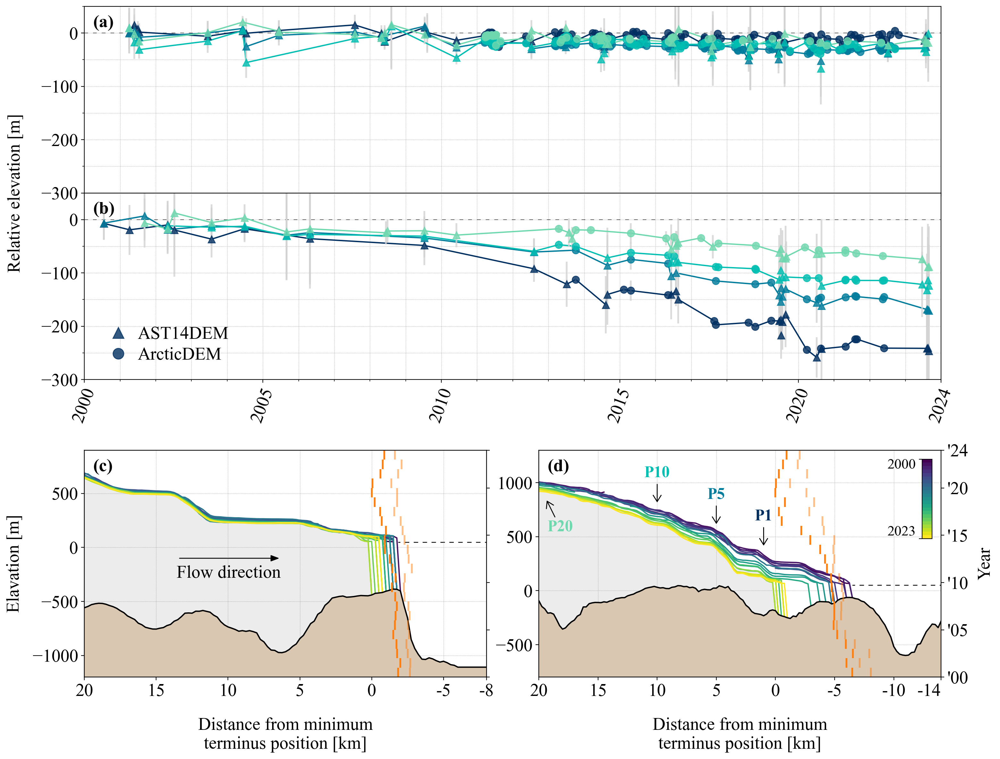

In [16]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr
from matplotlib.container import ErrorbarContainer
from matplotlib.dates import DateFormatter, YearLocator, date2num
from matplotlib.gridspec import GridSpec
from matplotlib.offsetbox import AnchoredText
from matplotlib.patches import FancyArrowPatch
from matplotlib.ticker import FuncFormatter, MultipleLocator
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from scipy.signal import find_peaks

COLOURS = {
    1_000: "#002f61",
    5_000: "#007c9c",
    10_000: "#00bfb2",
    20_000: "#6fd8af",
}
ANNOTATION_POINTS = {
    1_000: [(1_000, 4_00), (1_000, 650)],
    5_000: [(5_000, 600), (5_000, 850)],
    10_000: [(10_000, 800), (10_000, 1_050)],
    20_000: [(19_400, 850), (18_200, 550)],
}


# Global plot settings
plt.rcParams["figure.dpi"] = 200
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["mathtext.fontset"] = "stix"
plt.rcParams["font.size"] = 20
plt.rcParams["axes.labelsize"] = 20
plt.rcParams["xtick.labelsize"] = 20
plt.rcParams["ytick.labelsize"] = 20

# Set up axes
fig = plt.figure(figsize=(16, 12.25))
gs0 = GridSpec(nrows=3, ncols=2, figure=fig, height_ratios=(1, 1, 1.5))
gs1 = gs0[0:2, :].subgridspec(nrows=2, ncols=2, hspace=0)
ax0 = fig.add_subplot(gs1[0, :])
ax1 = fig.add_subplot(gs1[1, :], sharex=ax0)
gs2 = gs0[2, :].subgridspec(nrows=1, ncols=2, wspace=0.13)
ax2 = fig.add_subplot(gs2[0, 0])
ax3 = fig.add_subplot(gs2[0, 1])
axs = [ax0, ax1, ax2, ax3]

# Merge ArcticDEM and AST14DEM datasets and calculate relative elevation changes
arctic_ds = xr.open_dataset("../data/elevation/arcticdem/elevation_arcticdem_points.nc")
aster_ds = xr.open_dataset("../data/elevation/asterdem/elevation_asterdem_points.nc")
elevation_ds = xr.combine_by_coords([arctic_ds, aster_ds], combine_attrs="drop_conflicts")
elevation_ds["dem_id"] = elevation_ds.dem_id.astype(str)
elevation_ds["source"] = elevation_ds.dem_id.str.extract(pat=r"^(SETSM|AST14DEM)", dim=None)
elevation_ds = elevation_ds.where(elevation_ds.h < 1500, drop=True)
elevation_ds = elevation_ds.where(elevation_ds.coreg_rmse < 100, drop=True)
elevation_ds_stack = elevation_ds.stack(glacier_cd=["glacier", "cd"]).compute()
elevation_ds_stack = elevation_ds_stack.where(elevation_ds_stack.h.notnull(), drop=True)
h = elevation_ds_stack.h.groupby("glacier_cd")
h_baseline = elevation_ds_stack.h.groupby("glacier_cd").map(lambda x: x.where(x.notnull(), drop=True).isel(time=0))
dh = h - h_baseline
elevation_ds["dh_merged"] = dh.unstack("glacier_cd").transpose("glacier", "cd", "time")

# Sample BedMachine
bedmachine_ds = xr.open_dataset("../data/misc/bedmachine/BedMachineGreenland-v5.nc")
bedmachine_ds = bedmachine_ds.sel(x=elevation_ds.x, y=elevation_ds.y, method="nearest").transpose("glacier", "cd")

# Load terminus data
terminus_ds = xr.open_dataset("../data/terminus/terminus_2000_2023.nc")

# Plot data on axes
for i, (glacier, ds) in enumerate(elevation_ds.groupby("glacier", squeeze=False)):
    ds = ds.where(ds.cd.isin([1_000, 5_000, 10_000, 20_000]), drop=True)

    for cd, cd_ds in ds.groupby("cd", squeeze=False):
        # Remove spikes (large instantaneous elevation changes)
        cd_ds = cd_ds.squeeze()
        dh = cd_ds.dh_merged.dropna("time")
        peaks, _ = find_peaks(dh, threshold=20)
        mask = np.ones(dh.shape, dtype=bool)
        mask[peaks] = False
        cd_ds = cd_ds.where(dh[mask], drop=True)

        # Plot relative elevation change time series
        dh = cd_ds.dh_merged.dropna("time")
        dh_asterdem = cd_ds.where(cd_ds.source == "AST14DEM").dh_merged.dropna("time")
        dh_arcticdem = cd_ds.where(cd_ds.source == "SETSM").dh_merged.dropna("time")
        dh_asterdem_error = cd_ds.where(cd_ds.source == "AST14DEM").coreg_rmse.dropna("time")
        dh_arcticdem_error = cd_ds.where(cd_ds.source == "SETSM").coreg_rmse.dropna("time")
        axs[i].plot(dh.time, dh, marker="", c=COLOURS[cd])
        axs[i].errorbar(
            dh_asterdem.time.values,
            dh_asterdem.values,
            yerr=dh_asterdem_error.values,
            linestyle="",
            marker="^",
            markersize=8,
            c=COLOURS[cd],
            elinewidth=2,
            ecolor="lightgrey",
            label="AST14DEM",
            alpha=0.8,
        )
        axs[i].errorbar(
            dh_arcticdem.time.values,
            dh_arcticdem.values,
            yerr=dh_arcticdem_error.values,
            linestyle="",
            marker="o",
            markersize=8,
            c=COLOURS[cd],
            elinewidth=2,
            ecolor="lightgrey",
            label="ArcticDEM",
            alpha=0.8,
        )

    ax_twinx = axs[i + 2].twinx()
    ds = terminus_ds.sel(glacier=glacier).squeeze()
    t_area = ds.area_width_averaged
    t_baseline = ds.area_width_averaged.dropna("time").sel(time="2019-12-07", method="nearest")
    ds["t_relative"] = t_area - t_baseline
    annual_mins = ds.t_relative.resample(time="1YS").min("time").squeeze() * -1
    for da in annual_mins:
        ax_twinx.vlines(
            x=da.values,
            ymin=da.time.values,
            ymax=da.time.values + np.timedelta64(365, "D"),
            colors=(1.0, 0.498, 0.055, 1.0),  # (1.0, 0.498, 0.055, 0.25),
            linestyles="-",
            linewidth=2,
            # alpha=0.4,
            zorder=1,
        )
    annual_maxs = ds.t_relative.resample(time="1YS").max("time").squeeze() * -1
    for da in annual_maxs:
        ax_twinx.vlines(
            x=da.values,
            ymin=da.time.values,
            ymax=da.time.values + np.timedelta64(365, "D"),
            colors=(1.0, 0.498, 0.055, 0.5),  # (1.0, 0.498, 0.055, 0.25),
            linestyles="-",
            linewidth=2,
            zorder=1,
        )

    # Format twinx y-axis
    ax_twinx.set_ylim(pd.to_datetime("2000-01-01"), pd.to_datetime("2024-01-01"))
    yticks = [date2num(pd.to_datetime(i, format="%Y")) for i in [2000, 2005, 2010, 2015, 2020, 2024]]
    ax_twinx.set_yticks(yticks)
    ax_twinx.yaxis.set_major_formatter(FuncFormatter(lambda x, _: f"'{str(pd.to_datetime(x, unit='D').year)[2:]}"))
    if i == 1:
        ax_twinx.set_ylabel("Year", labelpad=10)
    else:
        ax_twinx.tick_params(labelright=False)

    # Plot BedMachine bed topography profiles
    bed = bedmachine_ds.sel(glacier=glacier)
    bed = bed.bed + bed.geoid
    axs[i + 2].plot(bed.cd, bed, color="black", zorder=10)
    axs[i + 2].fill_between(bed.cd, bed, -2_000, color="#D9C7B1", zorder=5)  # D9C7B1 #ececec

    # Plot annual summer median elevation profiles along centre flowlines
    for k, year in enumerate(range(2000, 2024)):
        # Calculate rolling 3km median of median summer elevation at each point
        year_ds = elevation_ds.sel(glacier=glacier, time=elevation_ds.time.dt.month.isin([5, 6, 7, 8, 9]))
        year_ds = year_ds.sel(time=year_ds.time.dt.year == year, cd=slice(-12_000, 20_000))
        h_profile = year_ds.h.median("time").rolling(cd=12).median()
        colour = plt.get_cmap("viridis", 24)(year - 2000)

        # Truncate elevation profile at current year minimum terminus position
        annual_min = annual_mins[k]
        annual_min_cd = h_profile.sel(cd=annual_min * 1, method="nearest").cd.item()
        h_profile = h_profile.where(h_profile.cd >= annual_min_cd, other=np.nan)

        # Append bed elevation to elevation profile at cd of minimum terminus position
        bed_val = bed.where(bed.cd == annual_min_cd, drop=True).values[0]
        h_profile = h_profile.where(h_profile.cd != annual_min_cd, other=bed_val)

        # Plot elevation profile
        axs[i + 2].plot(h_profile.cd, h_profile, c=colour)

        overall_min = annual_mins.where(annual_mins == annual_mins.max("time"), drop=True).time.dt.year.item()
        if year == overall_min:
            bed_subset = bed.sel(cd=h_profile.cd)
            axs[i + 2].fill_between(h_profile.cd, h_profile, bed_subset, color="#ececec", zorder=1)  # D9C7B1 #ececec

    axs[i + 2].hlines(
        y=50,
        xmin=-15_000,
        xmax=annual_mins[0],
        colors="black",
        alpha=0.9,
        linewidth=1,
        zorder=1,
        linestyles=(0, (5, 5)),
    )


ax0.set_xlim(pd.to_datetime("2000-01-01"), pd.to_datetime("2024-01-01"))
ax1.set_xlim(pd.to_datetime("2000-01-01"), pd.to_datetime("2024-01-01"))
ax0.xaxis.set_major_formatter(DateFormatter("%Y"))
ax1.xaxis.set_major_formatter(DateFormatter("%Y"))
ax0.xaxis.set_major_locator(YearLocator(5))
ax1.xaxis.set_major_locator(YearLocator(5))
ax0.xaxis.set_minor_locator(YearLocator(1))
ax1.xaxis.set_minor_locator(YearLocator(1))
ax0.tick_params(axis="x", rotation=70)
ax1.tick_params(axis="x", rotation=70)
ax0.margins(x=0)
ax1.margins(x=0)
xticks = [date2num(pd.to_datetime(i, format="%Y")) for i in [2000, 2005, 2010, 2015, 2020, 2024]]
ax1.set_xticks(xticks)
ax0.tick_params(labelbottom=False)

ax0.set_ylim(bottom=-300, top=50)
ax1.set_ylim(bottom=-300, top=50)
ax1.set_ylabel("Relative elevation [m]", y=1, labelpad=20)
ax0.yaxis.set_minor_locator(MultipleLocator(50))
ax1.yaxis.set_minor_locator(MultipleLocator(50))

ax0.axhline(y=0, c="black", alpha=0.7, linewidth=0.7, zorder=1, linestyle=(0, (6, 8)))
ax1.axhline(y=0, c="black", alpha=0.7, linewidth=0.7, zorder=1, linestyle=(0, (6, 8)))
ax0.grid(True, which="both", axis="both", c="gray", linestyle=":", linewidth=0.5, alpha=0.8, zorder=0)
ax1.grid(True, which="both", axis="both", c="gray", linestyle=":", linewidth=0.5, alpha=0.8, zorder=0)
ax0.add_artist(AnchoredText(f"(a)", loc="upper left", borderpad=0.1, prop=dict(weight="semibold"), frameon=False))
ax1.add_artist(AnchoredText(f"(b)", loc="upper left", borderpad=0.1, prop=dict(weight="semibold"), frameon=False))

handles, labels = ax1.get_legend_handles_labels()
handles = [h[0] if isinstance(h, ErrorbarContainer) else h for h in handles]
handles = [h for h in handles if h.get_marker() in ["^", "o"]][0:2]
ax1.legend(
    handles,
    labels[0:2],
    frameon=False,
    loc="lower left",
    fontsize=20,
    markerscale=1.5,
    scatterpoints=1,
    labelspacing=0.25,
    handletextpad=0.1,
)

ax2.set_xlim(-8_000, 20_000)
ax3.set_xlim(-14_000, 20_000)
ax2.margins(x=0)
ax3.margins(x=0)
ax2.invert_xaxis()
ax3.invert_xaxis()
ax2.set_xticks([20_000, 15_000, 10_000, 5_000, 0, -5_000, -8_000])
ax3.set_xticks([20_000, 15_000, 10_000, 5_000, 0, -5_000, -10_000, -14_000])
ax2.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x / 1000:.0f}"))
ax3.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x / 1000:.0f}"))
ax2.set_xlabel("Distance from minimum\nterminus position [km]", labelpad=20)
ax3.set_xlabel("Distance from minimum\nterminus position [km]", labelpad=20)
ax3.get_xticklabels()[-1].set_horizontalalignment("right")

ax2.set_ylim(-1_200, 900)
ax3.set_ylim(-800, 1_300)
ax2.set_ylabel("Elavation [m]", labelpad=11)

ax2.grid(True, which="both", axis="both", c="gray", linestyle=":", linewidth=0.5, alpha=0.8, zorder=0)
ax3.grid(True, which="both", axis="both", c="gray", linestyle=":", linewidth=0.5, alpha=0.8, zorder=0)
ax2.add_artist(AnchoredText("(c)", loc="upper left", borderpad=0.1, prop=dict(weight="semibold"), frameon=False))
ax3.add_artist(AnchoredText("(d)", loc="upper left", borderpad=0.1, prop=dict(weight="semibold"), frameon=False))

arr = FancyArrowPatch((13_500, -100), (6_300, -100), arrowstyle="-|>,head_width=.15", mutation_scale=20, color="black")
ax2.add_patch(arr)
ax2.annotate("Flow direction", (0.5, -0.8), xycoords=arr, ha="center", va="top")


for key, val in ANNOTATION_POINTS.items():
    xy, xytext = val
    ax3.annotate(
        f"P{key / 1_000:.0f}",
        xy=xy,
        xytext=xytext,
        xycoords="data",
        fontsize=18,
        fontweight="semibold",
        horizontalalignment="center",
        color=COLOURS[key],
        arrowprops=dict(facecolor="black", arrowstyle="->,head_width=0.25"),
    )

ax_cbar = inset_axes(ax3, width="2.5%", height="35%", loc="upper right")
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap=plt.get_cmap("viridis", 23), norm=plt.Normalize(vmin=0, vmax=23)),
    cax=ax_cbar,
    orientation="vertical",
    ticks=[0, 23],
    label="",
    pad=0.25,
)
ax_cbar.tick_params(labelsize=16)
ax_cbar.yaxis.set_ticks_position("left")
ax_cbar.yaxis.set_label_position("left")
ax_cbar.invert_yaxis()
ax_cbar.yaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x + 2000:.0f}"))
ax_cbar.get_yticklabels()[0].set_verticalalignment("top")
ax_cbar.get_yticklabels()[-1].set_verticalalignment("bottom")

for _, spine in ax2.spines.items():
    spine.set_zorder(15)

for _, spine in ax3.spines.items():
    spine.set_zorder(15)


plt.tight_layout()
plt.savefig("../img/lowres/figure_4_elevation.png", dpi=fig.dpi, bbox_inches="tight")
plt.show()

## Figure 5 Runoff

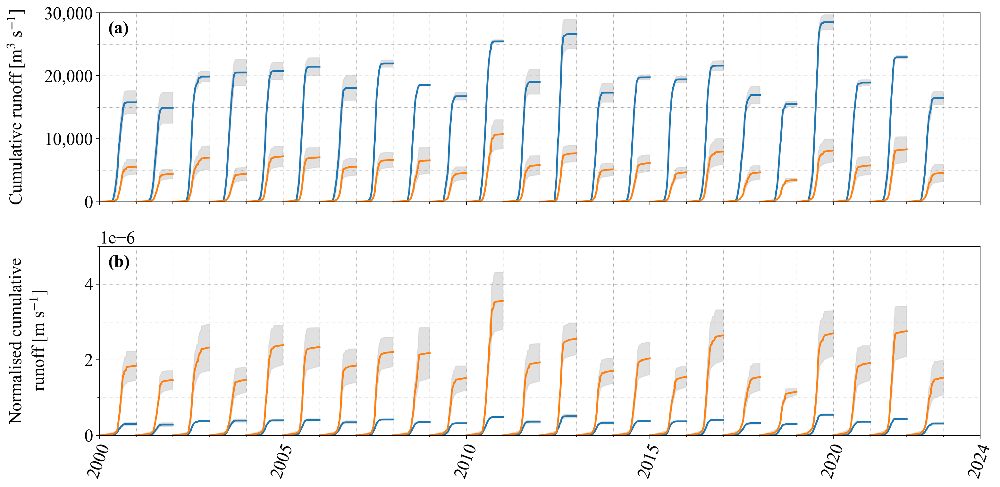

In [19]:
import matplotlib.pyplot as plt
import pandas as pd
import xarray as xr
from matplotlib.dates import DateFormatter, YearLocator, date2num
from matplotlib.gridspec import GridSpec
from matplotlib.offsetbox import AnchoredText
from matplotlib.ticker import FuncFormatter, MultipleLocator

PLOT_SETTINGS = {
    "DAUGAARD-JENSEN": {
        "colour": [(0.122, 0.467, 0.706, 1.0), (0.122, 0.467, 0.706, 0.25)],
        "label": "Daugaard-Jensen",
    },
    "UNNAMED_UUNARTIT_ISLANDS": {
        "colour": [(1.0, 0.498, 0.055, 1.0), (1.0, 0.498, 0.055, 0.25)],
        "label": "Uunartit Islands",
    },
}

# Global plot settings
plt.rcParams["figure.dpi"] = 200
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["mathtext.fontset"] = "stix"
plt.rcParams["font.size"] = 20
plt.rcParams["axes.labelsize"] = 20
plt.rcParams["xtick.labelsize"] = 20
plt.rcParams["ytick.labelsize"] = 20

# Set up axes
fig = plt.figure(figsize=(16, 8))
gs = GridSpec(nrows=2, ncols=1)
ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[1, 0], sharex=ax0)
axs = [ax0, ax1]

# Read runoff time series
runoff_ds = xr.open_dataset("../data/runoff/runoff_2000_2024.nc")

# Plot data for each glacier in turn
for glacier, ds in runoff_ds.groupby("glacier", squeeze=False):
    runoff_cumulative = ds.groupby(runoff_ds.time.dt.year).cumsum()
    runoff_cumulative = runoff_cumulative.where(runoff_ds.time.dt.is_year_start != True)
    runoff_cumulative["glacier"] = ds.glacier

    runoff_cumulative_normalised = runoff_cumulative / runoff_cumulative.basin_area

    # Plot monthly mean surface air temperature
    axs[0].plot(
        runoff_cumulative.discharge_model_average.time,
        runoff_cumulative.discharge_model_average.squeeze(),
        color=PLOT_SETTINGS[glacier]["colour"][0],
        linewidth=2,
        label=PLOT_SETTINGS[glacier]["label"],
    )
    axs[0].fill_between(
        runoff_cumulative.discharge_model_average.time,
        runoff_cumulative.sel(model="RACMO").discharge.squeeze(),
        runoff_cumulative.sel(model="MAR").discharge.squeeze(),
        color="lightgrey",  # PLOT_SETTINGS[glacier]["colour"][1],
        alpha=0.7,
    )

    axs[1].plot(
        runoff_cumulative_normalised.discharge_model_average.time,
        runoff_cumulative_normalised.discharge_model_average.squeeze(),
        linestyle="-",
        linewidth=2,
        color=PLOT_SETTINGS[glacier]["colour"][0],
        label=PLOT_SETTINGS[glacier]["label"],
    )
    axs[1].fill_between(
        runoff_cumulative_normalised.discharge_model_average.time,
        runoff_cumulative_normalised.sel(model="RACMO").discharge.squeeze(),
        runoff_cumulative_normalised.sel(model="MAR").discharge.squeeze(),
        color="lightgrey",  # PLOT_SETTINGS[glacier]["colour"][1],
        alpha=0.7,
    )

# Set y-axis range to fit data and add label
axs[0].set_ylim(bottom=0, top=30_000)
axs[0].set_ylabel("Cumulative runoff [m$^3$ s$^{-1}$]", labelpad=20)
axs[1].set_ylim(bottom=0, top=5e-6)
axs[1].set_ylabel("Normalised cumulative\nrunoff [m s$^{-1}$]", labelpad=40)
axs[0].yaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x:,.0f}"))
axs[0].yaxis.set_minor_locator(MultipleLocator(5_000))
axs[1].yaxis.set_minor_locator(MultipleLocator(1e-6))

axs[0].set_xlim(pd.to_datetime("2000-01-01"), pd.to_datetime("2024-01-01"))
axs[1].set_xlim(pd.to_datetime("2000-01-01"), pd.to_datetime("2024-01-01"))
axs[0].xaxis.set_major_formatter(DateFormatter("%Y"))
axs[0].xaxis.set_major_locator(YearLocator(5))
axs[0].xaxis.set_minor_locator(YearLocator(1))
axs[0].tick_params(labelbottom=False)
axs[1].xaxis.set_major_formatter(DateFormatter("%Y"))
axs[1].xaxis.set_major_locator(YearLocator(5))
axs[1].xaxis.set_minor_locator(YearLocator(1))
axs[1].tick_params(axis="x", rotation=70)
axs[0].margins(x=0)
axs[1].margins(x=0)
xticks = [date2num(pd.to_datetime(i, format="%Y")) for i in [2000, 2005, 2010, 2015, 2020, 2024]]
axs[0].set_xticks(xticks)
axs[1].set_xticks(xticks)

axs[0].grid(True, which="both", axis="both", c="gray", linestyle=":", linewidth=0.5, alpha=0.8, zorder=0)
axs[1].grid(True, which="both", axis="both", c="gray", linestyle=":", linewidth=0.5, alpha=0.8, zorder=0)
axs[0].add_artist(AnchoredText("(a)", loc="upper left", borderpad=0.1, prop=dict(weight="semibold"), frameon=False))
axs[1].add_artist(AnchoredText("(b)", loc="upper left", borderpad=0.1, prop=dict(weight="semibold"), frameon=False))

plt.tight_layout()
plt.savefig("../img/lowres/figure_5_runoff.png", dpi=fig.dpi, bbox_inches="tight")
plt.show()

## Figure 6 Air temp

C:\Users\olive\AppData\Local\Temp\ipykernel_12216\2128662014.py:121: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


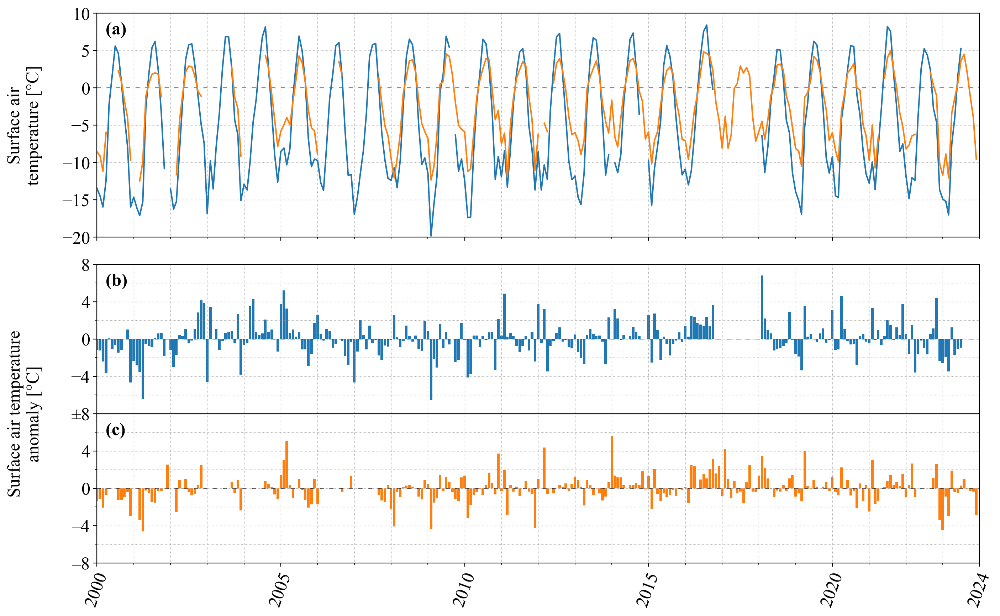

In [21]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr
from matplotlib.dates import DateFormatter, YearLocator, date2num
from matplotlib.gridspec import GridSpec
from matplotlib.offsetbox import AnchoredText
from matplotlib.ticker import MultipleLocator

PLOT_SETTINGS = {
    "DAUGAARD-JENSEN": {
        "colour": [(0.122, 0.467, 0.706, 1.0), (0.122, 0.467, 0.706, 0.25)],
        "label": "IT",
    },
    "UNNAMED_UUNARTIT_ISLANDS": {
        "colour": [(1.0, 0.498, 0.055, 1.0), (1.0, 0.498, 0.055, 0.25)],
        "label": "AP",
    },
}

# Global plot settings
plt.rcParams["figure.dpi"] = 200
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 18
plt.rcParams["axes.labelsize"] = 18
plt.rcParams["xtick.labelsize"] = 18
plt.rcParams["ytick.labelsize"] = 18

# Set up axes
fig = plt.figure(figsize=(16, 16))
gs0 = GridSpec(nrows=3, ncols=1, figure=fig, height_ratios=(0.75, 1, 1), hspace=0.1)
gs1 = gs0[0].subgridspec(nrows=1, ncols=1)
ax0 = fig.add_subplot(gs0[0, 0])
gs2 = gs0[1:2].subgridspec(nrows=2, ncols=1, hspace=0)
ax1 = fig.add_subplot(gs2[0, 0])
ax2 = fig.add_subplot(gs2[1, 0])
axs = [ax0, ax1, ax2]


# Read temperature time series produced above from disk
t_ds = xr.open_dataset(f"../data/air/air_temp_monthly_2000_2024.nc")

# Plot data for each glacier in turn
for glacier, t_ds_glacier in t_ds.groupby("glacier", squeeze=False):
    # Plot monthly mean surface air temperature
    temperature = t_ds_glacier.temperature.squeeze()
    axs[0].plot(
        temperature.time,
        temperature,
        color=PLOT_SETTINGS[glacier]["colour"][0],
        linewidth=1.5,
        label=PLOT_SETTINGS[glacier]["label"],
    )

    # Plot anomalies of monthly mean surface air temperature
    temperature_anomaly = t_ds_glacier.temperature_anomaly.squeeze()
    if glacier == "DAUGAARD-JENSEN":
        ax1.bar(
            temperature_anomaly.time,
            temperature_anomaly,
            color=PLOT_SETTINGS[glacier]["colour"][0],
            width=np.timedelta64(25, "D"),
            align="center",
            label=PLOT_SETTINGS[glacier]["label"],
        )
    else:
        ax2.bar(
            temperature_anomaly.time,
            temperature_anomaly,
            color=PLOT_SETTINGS[glacier]["colour"][0],
            width=np.timedelta64(25, "D"),
            align="center",
            label=PLOT_SETTINGS[glacier]["label"],
        )

axs[0].set_ylim(bottom=-20, top=10)
axs[0].set_ylabel("Surface air\ntemperature [\N{DEGREE SIGN}C]", labelpad=20)
axs[1].set_ylim(bottom=-8, top=8)
axs[2].set_ylim(bottom=-8, top=8)
axs[2].set_ylabel("Surface air temperature\nanomaly [\N{DEGREE SIGN}C]", y=1, labelpad=29)
axs[1].yaxis.set_major_locator(MultipleLocator(4))
axs[1].yaxis.set_minor_locator(MultipleLocator(2))
axs[2].yaxis.set_major_locator(MultipleLocator(4))
axs[2].yaxis.set_minor_locator(MultipleLocator(2))
ax1.set_yticks(ax1.get_yticks()[2:-1])
ax2.set_yticks(ax2.get_yticks()[1:-1])
ax2.set_yticklabels(["–8", "–4", "0", "4", "±8"])

axs[0].set_xlim(pd.to_datetime("2000-01-01"), pd.to_datetime("2024-01-01"))
axs[1].set_xlim(pd.to_datetime("2000-01-01"), pd.to_datetime("2024-01-01"))
axs[2].set_xlim(pd.to_datetime("2000-01-01"), pd.to_datetime("2024-01-01"))
axs[0].xaxis.set_major_formatter(DateFormatter("%Y"))
axs[0].xaxis.set_major_locator(YearLocator(5))
axs[0].xaxis.set_minor_locator(YearLocator(1))
axs[1].xaxis.set_major_formatter(DateFormatter("%Y"))
axs[1].xaxis.set_major_locator(YearLocator(5))
axs[1].xaxis.set_minor_locator(YearLocator(1))
axs[2].xaxis.set_major_formatter(DateFormatter("%Y"))
axs[2].xaxis.set_major_locator(YearLocator(5))
axs[2].xaxis.set_minor_locator(YearLocator(1))
axs[2].tick_params(axis="x", rotation=70)
axs[0].tick_params(labelbottom=False)
axs[1].tick_params(labelbottom=False)
xticks = [date2num(pd.to_datetime(i, format="%Y")) for i in [2000, 2005, 2010, 2015, 2020, 2024]]
axs[2].set_xticks(xticks)
axs[0].margins(x=0)
axs[1].margins(x=0)

axs[0].axhline(y=0, c="black", alpha=0.7, linewidth=0.7, zorder=1, linestyle=(0, (6, 8)))
axs[1].axhline(y=0, c="black", alpha=0.7, linewidth=0.7, zorder=1, linestyle=(0, (6, 8)))
axs[2].axhline(y=0, c="black", alpha=0.7, linewidth=0.7, zorder=1, linestyle=(0, (6, 8)))
axs[0].grid(True, which="both", axis="both", c="gray", linestyle=":", linewidth=0.5, alpha=0.8, zorder=0)
axs[1].grid(True, which="both", axis="both", c="gray", linestyle=":", linewidth=0.5, alpha=0.8, zorder=0)
axs[2].grid(True, which="both", axis="both", c="gray", linestyle=":", linewidth=0.5, alpha=0.8, zorder=0)
axs[0].add_artist(AnchoredText("(a)", loc="upper left", borderpad=0.1, prop=dict(weight="semibold"), frameon=False))
axs[1].add_artist(AnchoredText("(b)", loc="upper left", borderpad=0.1, prop=dict(weight="semibold"), frameon=False))
axs[2].add_artist(AnchoredText("(c)", loc="upper left", borderpad=0.1, prop=dict(weight="semibold"), frameon=False))

# ax0.legend(frameon=False, loc="lower left", fontsize=20, markerscale=5, scatterpoints=1)

plt.tight_layout()
plt.savefig("../img/lowres/figure_6_air.png", dpi=fig.dpi, bbox_inches="tight")
plt.show()

## Figure 7 Ocean temp

C:\Users\olive\AppData\Local\Temp\ipykernel_12216\3419372588.py:122: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


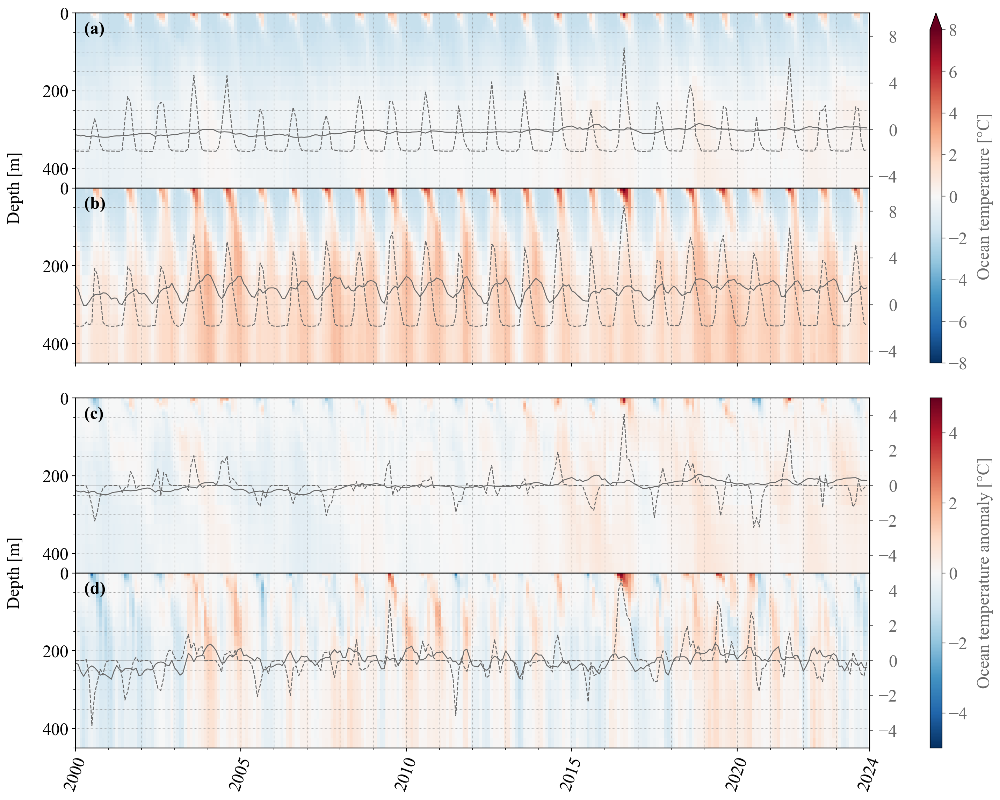

In [23]:
import matplotlib.pyplot as plt
import pandas as pd
import xarray as xr
from matplotlib.dates import DateFormatter, YearLocator
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec
from matplotlib.offsetbox import AnchoredText

# Global plot settings
plt.rcParams["figure.dpi"] = 200
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 18
plt.rcParams["axes.labelsize"] = 18
plt.rcParams["xtick.labelsize"] = 18
plt.rcParams["ytick.labelsize"] = 18
plt.rcParams["axes.unicode_minus"] = True

# Set up axes
fig = plt.figure(figsize=(16, 28))
gs0 = GridSpec(nrows=4, ncols=2, figure=fig, width_ratios=[1, 0.015], hspace=0.1)
gs1 = gs0[0:2].subgridspec(nrows=2, ncols=2, hspace=0, wspace=0.15, width_ratios=[1, 0.015])
ax0 = fig.add_subplot(gs1[0, 0])
ax1 = fig.add_subplot(gs1[1, 0])
gs2 = gs0[2:4].subgridspec(nrows=2, ncols=2, hspace=0, wspace=0.15, width_ratios=[1, 0.015])
ax2 = fig.add_subplot(gs2[0, 0])
ax3 = fig.add_subplot(gs2[1, 0])
axs = [ax0, ax1, ax2, ax3]

ax0_twinx = ax0.twinx()
ax1_twinx = ax1.twinx()
ax2_twinx = ax2.twinx()
ax3_twinx = ax3.twinx()
axs_twinx = [ax0_twinx, ax1_twinx, ax2_twinx, ax3_twinx]

gs1_cbar_gs = GridSpecFromSubplotSpec(1, 1, subplot_spec=gs1[:, 1])
gs2_cbar_gs = GridSpecFromSubplotSpec(1, 1, subplot_spec=gs2[:, 1])
gs1_cbar = fig.add_subplot(gs1_cbar_gs[0, 0])
gs2_cbar = fig.add_subplot(gs2_cbar_gs[0, 0])
axs_cbar = [gs1_cbar, gs2_cbar]

# Read temperature time series
ocean_ds = xr.open_dataset(f"../data/ocean/ocean_temp_monthly_2000_2022.nc")

# Group data by glacier
for i, (glacier, ds) in enumerate(ocean_ds.groupby("glacier", squeeze=False)):
    # Extract data
    temperature = ds.squeeze().temperature
    temperature_deep = ds.temperature.sel(depth=slice(200, 400)).mean(dim="depth").squeeze()
    temperature_surface = ds.temperature.sel(depth=slice(2, 6)).mean(dim="depth").squeeze()
    temperature_anomaly = ds.squeeze().temperature_anomaly
    temperature_anomaly_deep = ds.temperature_anomaly.sel(depth=slice(200, 400)).mean(dim="depth").squeeze()
    temperature_anomaly_surface = ds.temperature_anomaly.sel(depth=slice(2, 6)).mean(dim="depth").squeeze()

    # Plot full depth data
    temperature.plot(ax=axs[i], x="time", cmap="RdBu_r", cbar_kwargs=dict(cax=gs1_cbar), vmin=-8, vmax=8)
    temperature_anomaly.plot(ax=axs[i + 2], x="time", cmap="RdBu_r", cbar_kwargs=dict(cax=gs2_cbar), vmin=-5, vmax=5)

    # Plot near-surface data
    temperature_deep.plot(ax=axs_twinx[i], linewidth=1, color="dimgrey")
    temperature_surface.plot(ax=axs_twinx[i], linewidth=1, linestyle="--", color="dimgrey")

    # Plot deep-water data
    temperature_anomaly_deep.plot(ax=axs_twinx[i + 2], linewidth=1, color="dimgrey")
    temperature_anomaly_surface.plot(ax=axs_twinx[i + 2], linewidth=1, linestyle="--", color="dimgrey")

# Format primary axes
for i, ax in enumerate(axs):
    ax.set_ylim(bottom=0, top=450)
    ax.yaxis.set_major_locator(MultipleLocator(200))
    ax.yaxis.set_minor_locator(MultipleLocator(50))
    ax.invert_yaxis()

    ax.set_xlim(pd.to_datetime("2000-01-01"), pd.to_datetime("2024-01-01"))
    ax.xaxis.set_major_formatter(DateFormatter("%Y"))
    ax.xaxis.set_major_locator(YearLocator(5))
    ax.xaxis.set_minor_locator(YearLocator(1))
    ax.margins(x=0)
    ax.set_xlabel("")

    ax.set_title("")
    ax.grid(True, which="both", axis="both", c="gray", linestyle=":", linewidth=0.5, alpha=0.8, zorder=0)
    ax.add_artist(
        AnchoredText(f"({chr(97 + i)})", loc="upper left", borderpad=0.1, prop=dict(weight="semibold"), frameon=False)
    )
ax0.set_ylabel("")
ax2.set_ylabel("")
ax1.set_ylabel("Depth [m]", y=1, labelpad=20)
ax3.set_ylabel("Depth [m]", y=1, labelpad=20)

xticks = [date2num(pd.to_datetime(i, format="%Y")) for i in [2000, 2005, 2010, 2015, 2020, 2024]]
ax3.set_xticks(xticks)
ax3.tick_params(axis="x", rotation=70)
ax0.tick_params(labelbottom=False)
ax1.tick_params(labelbottom=False)
ax2.tick_params(labelbottom=False)

# Format twin axes
for ax_twinx in axs_twinx:
    ax_twinx.set_ylabel("")
    ax_twinx.tick_params(axis="y", colors="dimgrey", pad=25)

    ax_twinx.set_title("")
    ax_twinx.axhline(y=0, c="dimgrey", alpha=0.4, linewidth=0.5, zorder=1)

ax0_twinx.set_ylim(bottom=-5, top=10)
ax1_twinx.set_ylim(bottom=-5, top=10)
ax0_twinx.set_yticks([8, 4, 0, -4])
ax1_twinx.set_yticks([8, 4, 0, -4])
ax0_twinx.set_yticks(ticks=ax0_twinx.get_yticks(), labels=ax0_twinx.get_yticklabels(), ha="right")
ax1_twinx.set_yticks(ticks=ax0_twinx.get_yticks(), labels=ax0_twinx.get_yticklabels(), ha="right")

ax2_twinx.set_ylim(bottom=-5, top=5)
ax3_twinx.set_ylim(bottom=-5, top=5)
ax2_twinx.set_yticks(ticks=[4, 2, 0, -2, -4], labels=["4", "2", "0", "\u22122", "\u22124"], ha="right")
ax3_twinx.set_yticks(ticks=[4, 2, 0, -2, -4], labels=["4", "2", "0", "\u22122", "\u22124"], ha="right")

# Format colourbar
gs1_cbar.set_ylabel("Ocean temperature [\N{DEGREE SIGN}C]", color="dimgrey", labelpad=10)
gs2_cbar.set_ylabel("Ocean temperature anomaly [\N{DEGREE SIGN}C]", color="dimgrey", labelpad=10)
gs1_cbar.tick_params(axis="y", colors="dimgrey")
gs2_cbar.tick_params(axis="y", colors="dimgrey")

plt.tight_layout()
plt.savefig("../img/lowres/figure_7_ocean.png", dpi=fig.dpi, bbox_inches="tight")
plt.show()

## Figure 8 Statistics

C:\Users\olive\AppData\Local\Temp\ipykernel_12216\99147631.py:118: UserWarning: The `squeeze` kwarg to GroupBy is being removed.Pass .groupby(..., squeeze=False) to disable squeezing, which is the new default, and to silence this warning.
  h_baseline = elevation_ds_stack.h.groupby("glacier_cd").map(lambda x: x.where(x.notnull(), drop=True).isel(time=0))


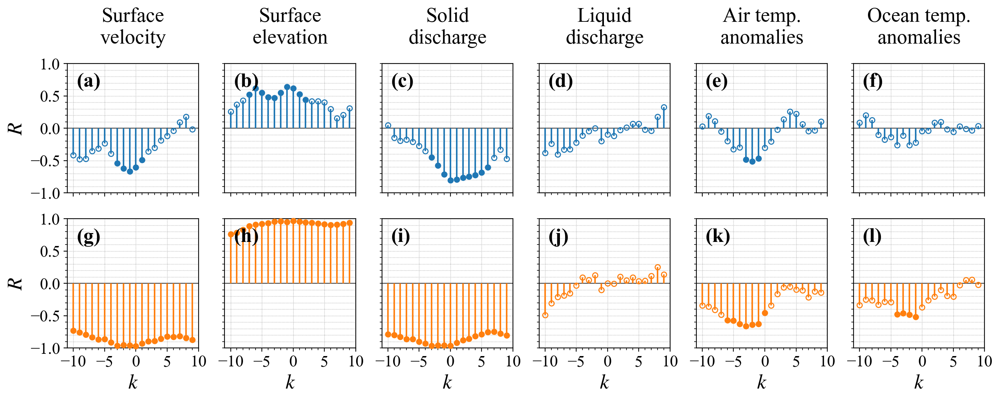

In [34]:
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats
import xarray as xr
from matplotlib.gridspec import GridSpec
from matplotlib.offsetbox import AnchoredText
from matplotlib.ticker import MultipleLocator


def xcorr(x, y, ax, glacier):
    mask = x.notnull() & y.notnull()
    x = x.where(mask, drop=True)
    y = y.where(mask, drop=True)

    lags = np.arange(-10, 10)
    r = np.zeros_like(lags, dtype=float)
    p = np.zeros_like(lags, dtype=float)

    for i, lag in enumerate(lags):
        y_shifted = y.shift(time=lag)

        mask = x.notnull() & y_shifted.notnull()
        x_masked = x.where(mask, drop=True)
        y_shifted = y_shifted.where(mask, drop=True)

        res = scipy.stats.linregress(x_masked, y_shifted)
        r[i] = res.rvalue
        p[i] = res.pvalue

    for lag_val, r_val, p_val in zip(lags, r, p):
        marker, stem, _ = ax.stem(lag_val, r_val, markerfmt="o")
        markerfacecolour = "none" if p_val > 0.05 else PLOT_SETTINGS[glacier]["colour"][0]
        plt.setp(
            marker, markerfacecolor=markerfacecolour, markeredgecolor=PLOT_SETTINGS[glacier]["colour"][0], markersize=5
        )
        plt.setp(stem, color=PLOT_SETTINGS[glacier]["colour"][0])
        marker.set_clip_on(False)
        marker.set_zorder(10)
        stem.set_clip_on(False)
        stem.set_zorder(10)

    return lags, r, p


PLOT_SETTINGS = {
    0: {
        "colour": [(0.122, 0.467, 0.706, 1.0), (0.122, 0.467, 0.706, 0.25)],
        "label": "Daugaard-Jensen",
    },
    1: {
        "colour": [(1.0, 0.498, 0.055, 1.0), (1.0, 0.498, 0.055, 0.25)],
        "label": "Uunartit Islands",
    },
}

# Global plot settings
plt.rcParams["figure.dpi"] = 200
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["mathtext.fontset"] = "stix"
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 20
plt.rcParams["axes.labelsize"] = 20
plt.rcParams["xtick.labelsize"] = 16
plt.rcParams["ytick.labelsize"] = 16

# Set up axes
fig = plt.figure(figsize=(16, 5))
gs = GridSpec(nrows=2, ncols=6, figure=fig)
ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1])
ax2 = fig.add_subplot(gs[0, 2])
ax3 = fig.add_subplot(gs[0, 3])
ax4 = fig.add_subplot(gs[0, 4])
ax5 = fig.add_subplot(gs[0, 5])
ax6 = fig.add_subplot(gs[1, 0])
ax7 = fig.add_subplot(gs[1, 1])
ax8 = fig.add_subplot(gs[1, 2])
ax9 = fig.add_subplot(gs[1, 3])
ax10 = fig.add_subplot(gs[1, 4])
ax11 = fig.add_subplot(gs[1, 5])
axs = [
    ax0,
    ax1,
    ax2,
    ax3,
    ax4,
    ax5,
    ax6,
    ax7,
    ax8,
    ax9,
    ax10,
    ax11,
]


cd = 1_000

terminus_ds = xr.open_dataset("../data/terminus/terminus_2000_2023.nc")

velocity_ds = xr.open_dataset("../data/velocity/velocity_subannual_2000_2022.nc")
velocity_ds = velocity_ds.sel(cd=cd)
velocity_ds = velocity_ds.where(velocity_ds.date_dt.dt.days <= 30, drop=True)
velocity_ds = velocity_ds.where(velocity_ds.v_error < 500, drop=True)
velocity_ds = velocity_ds.sortby("mid_date").resample(mid_date="1YS").mean("mid_date")
velocity_ds = velocity_ds.rename(mid_date="time")

arctic_ds = xr.open_dataset("../data/elevation/arcticdem/elevation_arcticdem_points.nc")
aster_ds = xr.open_dataset("../data/elevation/asterdem/elevation_asterdem_points.nc")
elevation_ds = xr.combine_by_coords([arctic_ds, aster_ds], combine_attrs="drop_conflicts")
elevation_ds["dem_id"] = elevation_ds.dem_id.astype(str)
elevation_ds["source"] = elevation_ds.dem_id.str.extract(pat=r"^(SETSM|AST14DEM)", dim=None)
elevation_ds = elevation_ds.where(elevation_ds.h < 1500, drop=True)
elevation_ds = elevation_ds.where(elevation_ds.coreg_rmse < 100, drop=True)
elevation_ds_stack = elevation_ds.stack(glacier_cd=["glacier", "cd"]).compute()
elevation_ds_stack = elevation_ds_stack.where(elevation_ds_stack.h.notnull(), drop=True)
h = elevation_ds_stack.h.groupby("glacier_cd")
h_baseline = elevation_ds_stack.h.groupby("glacier_cd").map(lambda x: x.where(x.notnull(), drop=True).isel(time=0))
dh = h - h_baseline
elevation_ds["dh_merged"] = dh.unstack("glacier_cd").transpose("glacier", "cd", "time")
elevation_ds = elevation_ds.sel(cd=cd)

discharge_ds = xr.open_dataset("../data/discharge/discharge_monthly_2000_2024.nc")
discharge_ds = discharge_ds.where(discharge_ds.coverage >= 0.50)

runoff_ds = xr.open_dataset("../data/runoff/runoff_2000_2024.nc")

air_ds = xr.open_dataset(f"../data/air/air_temp_monthly_2000_2024.nc")

ocean_ds = xr.open_dataset(f"../data/ocean/ocean_temp_monthly_2000_2022.nc")

for glacier in [0, 1]:
    retreat = terminus_ds.isel(glacier=glacier)
    retreat = retreat.area_width_averaged_change.dropna("time").resample(time="1YS").mean("time")

    velocity = velocity_ds.isel(glacier=glacier)
    velocity = velocity.v.dropna("time")

    elevation = elevation_ds.isel(glacier=glacier)
    elevation = (
        elevation.sel(time=elevation_ds.time.dt.month.isin([5, 6, 7, 8, 9]))
        .dh_merged.dropna("time")
        .resample(time="1YS")
        .mean("time")
        .interpolate_na("time")
    )

    discharge = discharge_ds.isel(glacier=glacier)
    discharge = discharge.discharge.resample(time="1YS").mean("time")

    runoff = runoff_ds.isel(glacier=glacier)
    runoff = runoff.discharge_model_average.resample(time="1YS").sum("time")

    air = air_ds.isel(glacier=glacier)
    air_summer = air.sel(time=air.time.dt.month.isin([6, 7, 8])).resample(time="1YS").mean("time")
    air = air.temperature_anomaly.resample(time="1YS").mean("time")

    ocean = ocean_ds.isel(glacier=glacier)
    ocean_surface = ocean.temperature_anomaly.sel(depth=slice(2, 6)).mean(dim="depth").resample(time="1YS").mean("time")
    ocean_surface_summer = (
        ocean.temperature.sel(depth=slice(2, 6), time=ocean.time.dt.month.isin([6, 7, 8]))
        .mean(dim="depth")
        .resample(time="1YS")
        .mean("time")
    )

    idx = glacier if glacier == 0 else glacier + 5

    lags, r, p = xcorr(velocity, retreat, axs[idx + 0], glacier)
    lags, r, p = xcorr(elevation, retreat, axs[idx + 1], glacier)
    lags, r, p = xcorr(discharge, retreat, axs[idx + 2], glacier)
    lags, r, p = xcorr(runoff, retreat, axs[idx + 3], glacier)
    lags, r, p = xcorr(air, retreat, axs[idx + 4], glacier)
    lags, r, p = xcorr(ocean_surface, retreat, axs[idx + 5], glacier)

for i, ax in enumerate(axs):
    ax.set_ylim(-1, 1)
    ax.set_xticks(ticks=[-10, 0, 10])
    ax.set_yticks(ticks=[])
    ax.yaxis.set_minor_locator(MultipleLocator(0.1))
    ax.xaxis.set_major_locator(MultipleLocator(5))
    ax.xaxis.set_minor_locator(MultipleLocator(1))
    ax.axhline(y=0, color="black", alpha=0.8, linewidth=0.8, zorder=1)
    ax.grid(True, which="major", axis="x", c="gray", linestyle=":", linewidth=0.5, alpha=0.8, zorder=0)
    ax.grid(True, which="both", axis="y", c="gray", linestyle=":", linewidth=0.5, alpha=0.8, zorder=0)
    ax.add_artist(
        AnchoredText(
            f"({chr(97 + i)})", loc="upper left", borderpad=0.05, prop=dict(weight="semibold"), frameon=False, zorder=10
        )
    )

ax0.set_title("Surface\nvelocity", pad=20)
ax1.set_title("Surface\nelevation", pad=20)
ax2.set_title("Solid\ndischarge", pad=20)
ax3.set_title("Liquid\ndischarge", pad=20)
ax4.set_title("Air temp.\nanomalies", pad=20)
ax5.set_title("Ocean temp.\nanomalies", pad=20)

ax0.set_ylabel("$R$", size=20)
ax6.set_ylabel("$R$", size=20)
ax0.set_yticks(ticks=[-1.0, -0.5, 0, 0.5, 1.0])
ax6.set_yticks(ticks=[-1.0, -0.5, 0, 0.5, 1.0])

ax0.tick_params(labelbottom=False)
ax1.tick_params(labelbottom=False)
ax2.tick_params(labelbottom=False)
ax3.tick_params(labelbottom=False)
ax4.tick_params(labelbottom=False)
ax5.tick_params(labelbottom=False)

ax6.set_xlabel("$k$", size=20)
ax7.set_xlabel("$k$", size=20)
ax8.set_xlabel("$k$", size=20)
ax9.set_xlabel("$k$", size=20)
ax10.set_xlabel("$k$", size=20)
ax11.set_xlabel("$k$", size=20)


plt.savefig("../img/lowres/figure_8_statistics.png", dpi=fig.dpi, bbox_inches="tight")
plt.show()

# PART II

## Figure 2 Map

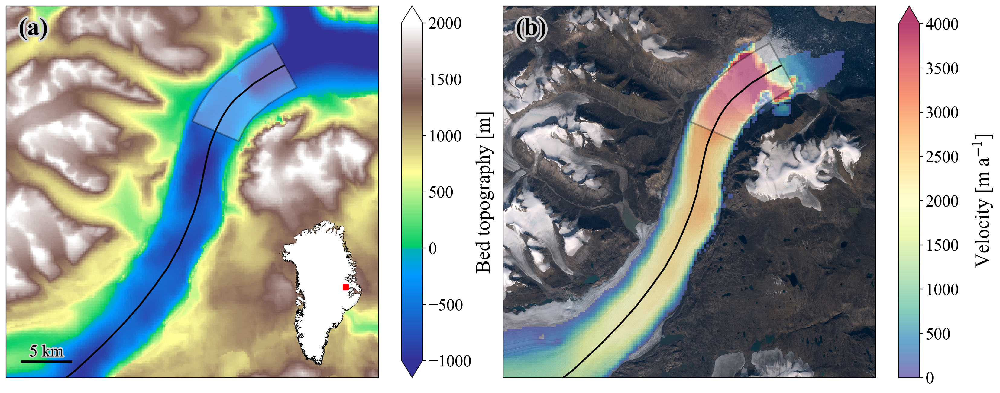

In [1]:
import cartopy.crs as ccrs
import geopandas as gpd
import matplotlib.colors
import matplotlib.patheffects as patheffects
import matplotlib.pyplot as plt
import numpy as np
import rioxarray as rxr
import shapely.geometry
import shapely.ops
from matplotlib.font_manager import FontProperties
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec
from matplotlib.offsetbox import AnchoredText
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar

# Plot paramaters
AXS_EXTENTS = {
    0: [200_000, -2_550_000, 1_000_000, -1_750_000],
    1: (535481.764, -1922392.335, 572336.604, -1885537.495),
    2: (467075.608, -2448422.750, 503930.448, -2411567.910),
    3: (-683319.877, -3352550.000, 1012836.774, -665405.245),
}

# Global plot settings
plt.rcParams["figure.dpi"] = 200
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["mathtext.fontset"] = "stix"
plt.rcParams["font.size"] = 20
plt.rcParams["axes.labelsize"] = 20
plt.rcParams["xtick.labelsize"] = 20
plt.rcParams["ytick.labelsize"] = 20

# Create EPSG:3413 projection
proj_3413 = ccrs.Stereographic(central_latitude=90, central_longitude=-45, true_scale_latitude=70)

# Set up axes
fig = plt.figure(figsize=(20, 8))
gs0 = GridSpec(nrows=1, ncols=4, figure=fig, height_ratios=[1], width_ratios=[1, 0.015, 1, 0.015], wspace=0.30)
gs1 = gs0[0:2].subgridspec(nrows=1, ncols=2, wspace=0, width_ratios=[1, 0.05])
ax0 = fig.add_subplot(gs1[0, 0], projection=proj_3413)
gs2 = gs0[2:4].subgridspec(nrows=1, ncols=2, wspace=0, width_ratios=[1, 0.05])
ax1 = fig.add_subplot(gs2[0, 0], projection=proj_3413)
ax3 = fig.add_subplot([0.258, 0.135, 0.30, 0.30], projection=proj_3413, zorder=10)
axs = [ax0, ax1, ax3]

gs1_cbar_gs = GridSpecFromSubplotSpec(1, 1, subplot_spec=gs1[:, 1])
gs2_cbar_gs = GridSpecFromSubplotSpec(1, 1, subplot_spec=gs2[:, 1])
gs1_cbar = fig.add_subplot(gs1_cbar_gs[0, 0])
gs2_cbar = fig.add_subplot(gs2_cbar_gs[0, 0])
axs_cbar = [gs1_cbar, gs2_cbar]

# Fix axes extents and remove background and border for inset
ax0.set_extent([AXS_EXTENTS[1][0], AXS_EXTENTS[1][2], AXS_EXTENTS[1][1], AXS_EXTENTS[1][3]], crs=ccrs.epsg(3413))
ax1.set_extent([AXS_EXTENTS[1][0], AXS_EXTENTS[1][2], AXS_EXTENTS[1][1], AXS_EXTENTS[1][3]], crs=ccrs.epsg(3413))
ax3.set_extent([AXS_EXTENTS[3][0], AXS_EXTENTS[3][2], AXS_EXTENTS[3][1], AXS_EXTENTS[3][3]], crs=ccrs.epsg(3413))
ax3.spines.geo.set_visible(False)
ax3.patch.set_alpha(0)

# Read Greenland outline and plot on inset and ax0
greenland = gpd.read_file("../data/misc/coastline/coastline.geojson")
greenland.plot(ax=ax3, facecolor="white", edgecolor="black", linewidth=0.25)

# Draw overview of ax0 on inset
overview = gpd.GeoDataFrame(geometry=[shapely.geometry.box(*AXS_EXTENTS[1])])
overview = overview.buffer(25_000, cap_style="square", join_style="mitre")
overview.plot(ax=ax3, facecolor="red", edgecolor="red", linewidth=2)

# Elevation cmap
colors_undersea = plt.cm.terrain(np.linspace(0, 0.20, 100))
colors_land = plt.cm.terrain(np.linspace(0.25, 1, 200))
colors = np.vstack((colors_undersea, colors_land))
cut_terrain_map = matplotlib.colors.LinearSegmentedColormap.from_list("cut_terrain", colors)
norm = matplotlib.colors.Normalize(vmax=2000)

# Plot BedMachine-v5 bedrock mask
bedmachine = rxr.open_rasterio("../data/misc/bedmachine/BedMachineGreenland-v5.nc")
bedmachine_bed = bedmachine.bed.rio.clip_box(*AXS_EXTENTS[1]).squeeze()
bedmachine_bed.plot(
    ax=ax0,
    vmin=-1_000,
    vmax=2_000,
    norm=norm,
    cmap=cut_terrain_map,
    cbar_kwargs=dict(cax=gs1_cbar),
    zorder=0,
    transform=proj_3413,
    add_labels=False,
)

# Plot basemap
basemap = rxr.open_rasterio(
    "/vsicurl/http://its-live-data.jpl.nasa.gov.s3.amazonaws.com/rgb_mosaics/GRE2/Greenlandmedian_Aug_2019.vrt"
)
map = basemap.rio.clip_box(*AXS_EXTENTS[1]).squeeze()
map.plot.imshow(ax=ax1)

# Plot velocity mosaic
velocity = rxr.open_rasterio(
    "/vsicurl/http://its-live-data.jpl.nasa.gov.s3.amazonaws.com/velocity_mosaic/landsat/v00.0/static/cog/GRE_G0240_0000_v_on_S3.vrt"
)
velocity = velocity.rio.clip_box(*AXS_EXTENTS[1]).squeeze()
velocity = velocity.where(velocity > 100.0, drop=True)
velocity.plot(ax=ax1, cmap="Spectral_r", vmin=0, vmax=4_000, cbar_kwargs=dict(cax=gs2_cbar), alpha=0.75)

centrelines = gpd.read_file("../data/misc/centreline_lines.geojson")
centrelines = centrelines.loc[centrelines.glacier == "DAUGAARD-JENSEN"]
centrelines.plot(ax=ax0, color="black", linewidth=2)
centrelines.plot(ax=ax1, color="black", linewidth=2)

boxes = gpd.read_file("../data/terminus/terminus_boxes.geojson")
boxes = boxes.loc[boxes.glacier == "DAUGAARD-JENSEN"]
boxes.plot(ax=ax0, facecolor="white", edgecolor="black", linewidth=2, alpha=0.3)
boxes.plot(ax=ax1, facecolor="white", edgecolor="black", linewidth=2, alpha=0.3)

# Draw axes labels
for i, ax in enumerate(axs[0:2]):
    label = AnchoredText(
        f"({chr(97 + i)})", loc="upper left", borderpad=0.1, prop=dict(weight="semibold", fontsize=30), frameon=False
    )
    label.txt._text.set_path_effects([patheffects.withStroke(linewidth=5, foreground="lightgrey")])
    ax.add_artist(label)

# Draw scale bar on ax1
scale_bar = AnchoredSizeBar(
    ax1.transData,
    5_000,
    "5 km",
    "lower left",
    pad=0.8,
    sep=1.1,
    label_top=True,
    color="black",
    frameon=False,
    size_vertical=150,
    fontproperties=FontProperties(size=20, math_fontfamily="stix"),
    fill_bar=True,
)
scale_bar.txt_label._text.set_path_effects([patheffects.withStroke(linewidth=3, foreground="lightgrey")])
ax0.add_artist(scale_bar)

ax0.set_title("")
ax1.set_title("")

gs1_cbar.set_ylabel("Bed topography [m]", labelpad=5, fontsize=24)
gs2_cbar.set_ylabel("Velocity [m a$^{-1}$]", labelpad=15, fontsize=24)

plt.savefig("../img/tr_centreline.png", dpi=fig.dpi, bbox_inches="tight")
plt.show()